In [9]:
import cv2
import datetime
import os
cam =cv2.VideoCapture(0)

In [2]:
def save_frame(frame):
    now=datetime.datetime.now()
    filename = "frames/frame_{}.png".format(now.strftime("%Y-%m-%d_%H-%M-%S"))
    cv2.imwrite(filename, frame)

In [3]:
cam.set(3,640) #set width as 640
cam.set(4,480) #set height as 480
scale=3 #resize of the image
wP=210*scale #width of the papper
hP=297*scale #height of the papper

In [ ]:
#canny image detection steps
# 1) noise reduction - because noise are high intensity values dangerous to canny
"""its redused using Gaussian filter"""
# 2) Gradient calculation-:smoothened image is filtered with sobel filter in both 
    #x and y direction to get derivatives of  Gx and Gy
"""magnitude = sqrt((dx)^2 + (dy)^2)
    direction = a.tan2(dy, dx)
    where,
        a - angle in radians b/w +ve x-axis and point(x,y) in cartesian plane
        signs of x,y determines quadrant of result.
        atan- is called arctan
        which returns a value in radians"""

"""Gradient angles are always perpendicular to edges """
# 3) Non-Maximum suppression(NMS)
""" perform Non-Maximum suppression to Get thin images on sobel x + sobel y combined images boarders
The algorithm goes through all the points on the image and find pixels with max value of gradient 
in x diretion on the image produced by object detection algorithm such as (R-CNN, SSD, YOLO and RetinaNet).
Algo goes through all the pixels and select max intensity pixels in the edge directions through gradient angle"""

"""Bounding boxes are rectangular shapes that are drawn around objects in an image or a video frame. 
These boxes are used to identify and localize objects within the image or video, and they are defined 
by their coordinates on the x and y axes, as well as their width and height."""
# 4) Double Thresholding and edge Tracking by histerisis.
"""if the eges of NMS<minimum value  are non edges, so discarded and
    if NMS>maximum values  are sure to be edges.
    those who lies between these 2 thresholds are classified edges or non-edges based 
    om their connectivity (hysteresis)
    
    if they are connected to "sure-edge" pixels, they are connected to be part of edges.
     otherwise they are also discarded."""



'if the eges of NMS<minimum value  are non edges, so discarded and\n    if NMS>maximum values  are sure to be edges.\n    those who lies between these 2 thresholds are classified edges or non-edges based \n    om their connectivity (hysteresis)\n    \n    if they are connected to "sure-edge" pixels, they are connected to be part of edges.\n     otherwise they are also discarded.'

In [ ]:
#Manual canny edge detector/.(jhon canny)
#1)Gauss filter: standard deviation σ. 
""" when σ is low graph is peaky(image will be more blured) and when σ curve will be flattened.
Gaussian filter will preserve the edges more than mean and avg filters"""


' when σ is low graph is peaky(image will be more blured) and when σ curve will be flattened.\nGaussian filter will preserve the edges more than mean and avg filters'

In [4]:
while True:
    check, frame = cam.read()#capture frame from video
    cv2.imshow('video', frame)
    key=cv2.waitKey(1)
    if key == ord('s'):
        save_frame(frame)
    if key==27 :
        break
cam.release()
cv2.destroyAllWindows()

In [10]:
path_to_image=("/home/agj/VSCODE/Jeffrin/Project obj-measur-sys/frames/")
def get_latest_image(directory, valid_extensions=('jpg', 'jpeg', 'png')):
    #get filepaths of all files and dirs in the given dir
    valid_files=[os.path.join(directory, filename) for filename in os.listdir(directory)]
    valid_files=[f for f in valid_files if '.' in f and f.rsplit('.',1)[1] in valid_extensions and os.path.isfile(f)]
    #f.rsplit('.',1)[1] split the string once and select the string after ".".
    #os.path.isfile(f) checks the string f corresponds to a valid file or not.
    if not valid_files:
        raise ValueError("No valid images in %s" % directory)
    return max(valid_files, key=os.path.getmtime)

last_image=get_latest_image(path_to_image)
print(last_image)
#function to get latest raw image file
def get_latest_raw_file(directory, valid_extensions=('raw')):
    #get filepaths of all files and dirs in the given dir
    valid_files=[os.path.join(directory, filename) for filename in os.listdir(directory)]
    valid_files=[f for f in valid_files if '.' in f and f.rsplit('.',1)[1] in valid_extensions and os.path.isfile(f)]
    #f.rsplit('.',1)[1] split the string once and select the string after ".".
    #os.path.isfile(f) checks the string f corresponds to a valid file or not.
    if not valid_files:
        raise ValueError("No valid images in %s" % directory)
    return max(valid_files, key=os.path.getmtime)

latest_raw=get_latest_raw_file(path_to_image)
print(latest_raw)

/home/agj/VSCODE/Jeffrin/Project obj-measur-sys/frames/frame_2023-04-05_00-14-03.png
/home/agj/VSCODE/Jeffrin/Project obj-measur-sys/frames/output image.raw


In [11]:
#RGB are 24bit i.e, 8bit * 3 channels.
#CMYK image is 32bit 8bit*4channels
from PIL import Image
Input_image = Image.open(last_image) 
print(Input_image.size)
print(Input_image.mode)
ROWS=480
columns=640
raw_image_bytes=bytearray(columns*ROWS*3)#create a byte array with size of RGB pixels(3) * cols * rows 
for y in range(ROWS):
    for x in range(columns):
        pixel=Input_image.getpixel((x,y))
        index=(y*columns+x)*3#index of the current pixel
        raw_image_bytes[index]=pixel[0]
        raw_image_bytes[index+1]=pixel[1]
        raw_image_bytes[index+2]=pixel[2]
#save raw image bytes to file
with open('output image.raw', 'wb') as f:
    f.write(raw_image_bytes)

(640, 480)
RGB


In [12]:
#view converted raw
with open('output image.raw', 'rb') as g:
    raw_img=g.read()
img=Image.frombytes('L', (640, 480), raw_img)#L indicate image is grayscale image, where pixel value represents intensity of light b/w black and white(8bit pixel depth) 
#img=img.convert('RGB')
"""When you convert a color image to grayscale, you're effectively reducing the image to a single channel that 
contains the brightness information of the original color image. This can give the impression that the resulting 
grayscale image is zoomed-out compared to the original color image, but in reality, the dimensions of the two images should be the same."""
imgcolor=Image.frombytes('RGB', (640, 480), raw_img)
print(img.mode)
print('Grayscale image dimensions:', img.size)
img.show()

L
Grayscale image dimensions: (640, 480)


In [13]:
#print data of file byte by byte utf-8 format
with open('output image.raw', 'rb') as p:
    byte=p.read(1)#1 specifies number of bytes read from a file
    while byte:
        #print byte value as an integer
        print(ord(byte))
              #Read next byte
        byte=p.read(1)#read will automatically increment file pointer to next byte

226
232
235
223
230
232
225
227
240
225
227
240
221
234
237
222
235
238
222
233
239
221
232
237
226
232
237
227
233
238
222
236
236
223
237
237
224
234
240
222
233
239
225
236
237
226
237
238
224
233
235
219
228
230
221
226
238
223
228
240
228
229
235
229
230
237
224
233
237
224
233
237
230
232
236
229
231
235
227
231
239
227
231
239
227
233
240
227
233
240
230
231
238
232
234
240
228
232
240
231
234
242
232
235
243
231
234
242
224
232
241
230
238
246
226
234
241
226
234
241
225
233
240
224
232
239
222
233
241
222
233
241
229
235
240
227
233
238
222
235
238
222
235
238
225
234
238
228
236
240
229
236
238
228
234
237
228
232
240
224
227
235
227
232
230
230
234
233
230
233
239
231
234
240
229
238
235
229
238
235
229
236
236
228
235
235
220
239
235
212
231
227
229
236
236
228
235
235
228
234
237
229
236
238
238
235
236
236
233
234
230
234
235
230
234
235
228
233
234
228
233
234
231
235
238
231
235
238
227
231
237
228
232
238
225
234
234
225
234
234
232
232
232
232
232
232
230
229
237
230


In [14]:
#covert tp np array
import numpy as np
raw_img=open(latest_raw)
print(raw_img)
imge=np.fromfile(raw_img, dtype=np.uint8, count=ROWS*columns)
print("Dimension of old img array: ", imge.ndim)
print("size of old img array: ", imge.size)
print("2D array of the original image is: \n", imge)

<_io.TextIOWrapper name='/home/agj/VSCODE/Jeffrin/Project obj-measur-sys/frames/output image.raw' mode='r' encoding='UTF-8'>
Dimension of old img array:  1
size of old img array:  307200
2D array of the original image is: 
 [225 214 238 ...  32  29  30]


In [16]:
#conversion from 1D to 2D array
"""By floor dividing total number of pixels with rows and columns or columns and columns
imd2D=tp// (cols, cols), where tp=total pixels"""
imge.shape=(imge.size // columns,columns)#imge.size // columns is to define rows which should be integer
#the columns secondly used for specift 2D numpy array columns
print("new dimension of  array", imge.ndim)
print("************************************************************")
print("2D array of the original image is: \n", imge)
print("************************************************************")
print("shape of the original image array is", imge.shape)



new dimension of  array 2
************************************************************
2D array of the original image is: 
 [[225 214 238 ... 196 205 202]
 [196 205 200 ... 148 157 150]
 [152 156 149 ... 115 104 103]
 ...
 [203 196 212 ...  91  99  95]
 [ 91  99 110 ...  30  53  44]
 [ 31  38  29 ...  32  29  30]]
************************************************************
shape of the original image array is (480, 640)


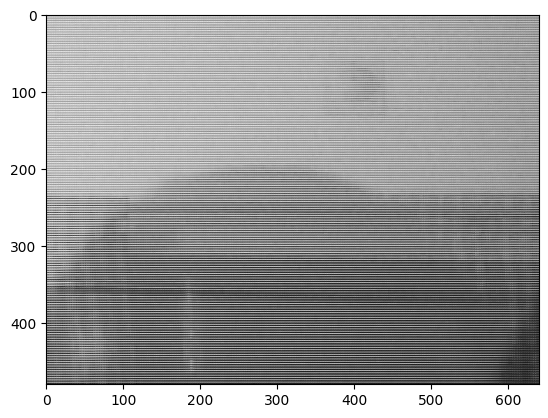

In [17]:
#display np.array to image
import matplotlib.pyplot as plt 
imge=imge.astype('int32')
plt.imshow(imge, cmap=plt.get_cmap('gray'))
plt.show()
# imgfromnp=cv2.cvtColor(imge, cv2.COLOR_BGR2RGB)
# cv2.imshow('RGB Image', imgfromnp)
# cv2.waitKey(0)
# cv2.destroyAllWindows()

In [18]:
import numpy as np
#Creating gaussian function
def gkernel(size, sig):
    #create grid matrix
    sigma_x=sig
    sigma_y=sig
    grid_points = []
    for y in range(-size//2+1, size//2+1):
        row = []
        for x in range(-size//2+1, size//2+1):
            row.append((x, y))
        grid_points.append(row)#grid is dot(.) product.
    # or using numpy==>
    # a,b = np.mgrid[-size//2:size//2+1, -size//2:size+1]
    #now creating gaussian function using eqauation.Gaussian function is depebd on distance between each point and origin
    #calculated using each point in grid and plot gaussian curve.
    #gaussian equation= (1/2*pi*sig)e^(-x^2+y^2)/2*sig^2
    def gaussian_fun(grid_points, Amplitude,sigma_x,sigma_y ):
        #assume xo,yo=0, which are x mean and y 
        xo,yo=0,0
        a = 1/(2*sigma_x**2)
        b = 1/(2*sigma_y**2)
        gaussian = Amplitude*np.exp(-(a*((x-xo)**2) + b*((y-yo)**2)))
        gaussed_grids=[]
        final_grids=[]
        cords=[]
        # Iterate over each row and element in the row
        for i in range(len(grid_points)):
            for j in range(len(grid_points[i])):
                # Multiply the element with the value
                for v in grid_points[i][j]:
                    v=v*gaussian
                    cords.append(v)
                gaussed_grids.append(tuple(cords))
                cords.clear()
            final_grids.append(list(gaussed_grids))
            gaussed_grids.clear()
        return final_grids
        
    # gaussian_fun(grid_points, .5, 3, 3)
    cordina=np.array(gaussian_fun(grid_points, .5, sig, sig))
    print(cordina)
    print("--------------------------------------------------------------------------------------------------------------")
    # cordina =
    print("sum is", sum(cordina))
    print("--------------------------------------------------------------------------------------------------------------")
    print(cordina)
    return cordina
    """convolution matrix/kernel"""
result=gkernel(2,3)
x_vals = result[:,:,0]
y_vals = result[:,:,1]

print(x_vals)
print("**************************************************************")
print(y_vals)

[[[0.         0.        ]
  [0.44741966 0.        ]]

 [[0.         0.44741966]
  [0.44741966 0.44741966]]]
--------------------------------------------------------------------------------------------------------------
sum is [[0.         0.44741966]
 [0.89483932 0.44741966]]
--------------------------------------------------------------------------------------------------------------
[[[0.         0.        ]
  [0.44741966 0.        ]]

 [[0.         0.44741966]
  [0.44741966 0.44741966]]]
[[0.         0.44741966]
 [0.         0.44741966]]
**************************************************************
[[0.         0.        ]
 [0.44741966 0.44741966]]


In [20]:
cv2.imshow("image",imge)

error: OpenCV(4.7.0) /io/opencv/modules/highgui/src/precomp.hpp:155: error: (-215:Assertion failed) src_depth != CV_16F && src_depth != CV_32S in function 'convertToShow'


In [129]:
import numpy as np
import cv2

# Load image
img = cv2.imread('image.jpg')

# Generate Gaussian kernel
kernel_size = 5
sigma = 1.0
kernel = np.zeros((kernel_size, kernel_size))
for i in range(kernel_size):
    for j in range(kernel_size):
        x = i - kernel_size // 2
        y = j - kernel_size // 2
        kernel[i, j] = (1 / (2 * np.pi * sigma ** 2)) * np.exp(-(x ** 2 + y ** 2) / (2 * sigma ** 2))

# Normalize kernel
kernel /= np.sum(kernel)

# Define convolution function
def convolve(image, kernel):
    kernel_size = kernel.shape[0]
    border = kernel_size // 2
    height, width, channels = image.shape
    convolved_image = np.zeros((height, width, channels))
    for i in range(border, height - border):
        for j in range(border, width - border):
            for k in range(channels):
                region = image[i - border:i + border + 1, j - border:j + border + 1, k]
                convolved_image[i, j, k] = np.sum(region * kernel)
    return convolved_image.astype(np.uint8)

# Apply kernel to image
blurred_img = convolve(img, kernel)


[ WARN:0@14693.120] global loadsave.cpp:244 findDecoder imread_('image.jpg'): can't open/read file: check file path/integrity


AttributeError: 'NoneType' object has no attribute 'shape'